# Silkworm feeding prediction




## Check GPU

In [1]:
import torch, subprocess, json, sys

# Test via PyTorch
if torch.cuda.is_available():
    print("PyTorch détecte un GPU :", torch.cuda.get_device_name(0))
else:
    print("PyTorch ne détecte pas de GPU.")

# Test via nvidia-smi (avec gestion d’erreur)
try:
    gpu_info = subprocess.check_output(["nvidia-smi", "-L"]).decode().strip()
    print("nvidia-smi répond :", gpu_info)
except FileNotFoundError:
    print("nvidia-smi absent : probablement pas de GPU ou runtime CPU.")
except subprocess.CalledProcessError as e:
    print("nvidia-smi existe mais renvoie une erreur :", e.output.decode())


PyTorch détecte un GPU : NVIDIA L4
nvidia-smi répond : GPU 0: NVIDIA L4 (UUID: GPU-47788365-366a-851d-2abd-68d909ef9239)


# Dataset import and exploration


Cette section configure l'environnement et analyse le dataset de vers à soie :

**Variables disponibles après exécution :**
- `zip_path` : Chemin vers le fichier ZIP du dataset
- `df` : DataFrame principal contenant les métadonnées
- `csv_files` : Liste des fichiers CSV trouvés
- `image_dirs` : Dossiers contenant les images
- `filename_col` / `FILENAME_COL` : Nom de la colonne contenant les noms de fichiers
- `label_col` / `LABEL_COL` : Nom de la colonne contenant les labels (0/1)
- `CLEAN_DF` : Dataset nettoyé avec seulement les images existantes
- `IMAGE_DIR` : Dossier principal contenant les images
- `ORGANIZED_DIR` : Structure organisée train/val/test
- `train_data`, `val_data`, `test_data` : DataFrames pour chaque split
- `image_stats` : Statistiques sur les propriétés des images



Cette section prépare entièrement le dataset pour l'entraînement d'un modèle de classification binaire.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

zip_path = "/content/drive/MyDrive/Copie de silk_dataset.zip"
print(zip_path)

Mounted at /content/drive
/content/drive/MyDrive/Copie de silk_dataset.zip


In [3]:
# 1 min d'extraction de fichier

import zipfile
import os


# Check if zip file exists
if os.path.exists(zip_path):
    print(f"Zip file found at: {zip_path}")

    # Extract the zip file
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall('/content/extracted_data')

    # Explore the extracted contents
    extracted_path = '/content/extracted_data'
    for root, dirs, files in os.walk(extracted_path):
        level = root.replace(extracted_path, '').count(os.sep)
        indent = ' ' * 2 * level
        # print(f'{indent}{os.path.basename(root)}/')
        subindent = ' ' * 2 * (level + 1)
        for file in files:
            print(f'{subindent}{file}')
else:
    print(f"Zip file not found at: {zip_path}")
    print("Available files in MyDrive:")
    for file in os.listdir("/content/drive/MyDrive/"):
        if file.endswith('.zip'):
            print(f"  {file}")

Zip file found at: /content/drive/MyDrive/Copie de silk_dataset.zip
    IMG_3734.jpg
    IMG_3755.jpg
    IMG_3157.jpg
    IMG_2977.jpg
    IMG_3545.jpg
    IMG_3553.jpg
    IMG_2894.jpg
    IMG_2667.jpg
    IMG_3399.jpg
    IMG_3635.jpg
    IMG_3884.jpg
    IMG_2826.jpg
    IMG_3387.jpg
    IMG_3044.jpg
    IMG_2962.jpg
    IMG_2991.jpg
    IMG_3493.jpg
    IMG_3086.jpg
    IMG_3138.jpg
    IMG_3831.jpg
    IMG_2978.jpg
    IMG_3923.jpg
    IMG_3176.jpg
    IMG_3337.jpg
    IMG_2693.jpg
    IMG_3918.jpg
    IMG_3271.jpg
    IMG_3838.jpg
    IMG_3883.jpg
    IMG_2728.jpg
    IMG_3742.jpg
    IMG_3028.jpg
    IMG_3872.jpg
    IMG_3445.jpg
    IMG_3573.jpg
    IMG_3795.jpg
    IMG_3574.jpg
    IMG_2989.jpg
    IMG_3975.jpg
    IMG_3993.jpg
    IMG_2791.jpg
    IMG_3270.jpg
    IMG_3805.jpg
    IMG_3179.jpg
    IMG_2806.jpg
    IMG_2876.jpg
    IMG_2690.jpg
    IMG_3394.jpg
    IMG_3991.jpg
    IMG_2868.jpg
    IMG_2973.jpg
    IMG_3969.jpg
    IMG_4015.jpg
    IMG_3441.jpg
    IMG_3059.j

In [4]:
import pandas as pd
import numpy as np
import os
import shutil
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Analyser le contenu extrait
print("📊 Analyse du dataset extrait:")
extracted_path = '/content/extracted_data'

# Trouver le fichier CSV
csv_files = []
image_dirs = []

for root, dirs, files in os.walk(extracted_path):
    for file in files:
        if file.endswith('.csv'):
            csv_files.append(os.path.join(root, file))
        elif file.endswith(('.jpg', '.jpeg', '.png')):
            if root not in image_dirs:
                image_dirs.append(root)

print(f"📋 Fichiers CSV trouvés: {len(csv_files)}")
for csv_file in csv_files:
    print(f"  - {csv_file}")

print(f"📁 Dossiers avec images trouvés: {len(image_dirs)}")
for img_dir in image_dirs:
    img_count = len([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])
    print(f"  - {img_dir} ({img_count} images)")

# 2. Charger et analyser le CSV
if csv_files:
    main_csv = csv_files[0]  # Prendre le premier CSV trouvé
    print(f"\n📊 Chargement du fichier: {os.path.basename(main_csv)}")

    df = pd.read_csv(main_csv)
    print(f"✅ Dataset chargé: {df.shape[0]} lignes, {df.shape[1]} colonnes")

    print("\n📋 Aperçu du dataset:")
    print(df.head())

    print("\n📊 Informations sur les colonnes:")
    print(df.info())

    print("\n📈 Colonnes disponibles:")
    for i, col in enumerate(df.columns):
        print(f"  {i+1}. {col}")
else:
    print("❌ Aucun fichier CSV trouvé!")

📊 Analyse du dataset extrait:
📋 Fichiers CSV trouvés: 1
  - /content/extracted_data/silk_dataset/0_data.csv
📁 Dossiers avec images trouvés: 1
  - /content/extracted_data/silk_dataset (1351 images)

📊 Chargement du fichier: 0_data.csv
✅ Dataset chargé: 1351 lignes, 2 colonnes

📋 Aperçu du dataset:
   classificazione          foto
0                0  IMG_2663.jpg
1                0  IMG_2664.jpg
2                0  IMG_2665.jpg
3                0  IMG_2666.jpg
4                0  IMG_2667.jpg

📊 Informations sur les colonnes:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1351 entries, 0 to 1350
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   classificazione  1351 non-null   int64 
 1   foto             1351 non-null   object
dtypes: int64(1), object(1)
memory usage: 21.2+ KB
None

📈 Colonnes disponibles:
  1. classificazione
  2. foto



🔍 Identification automatique des colonnes:
🏷️ Colonne label détectée: 'classificazione'
📄 Colonne nom de fichier détectée: 'foto'

✅ Configuration détectée:
  - Images: colonne 'foto'
  - Labels: colonne 'classificazione'

📊 Distribution des labels:
classificazione
0    595
1    756
Name: count, dtype: int64

📈 Pourcentages:
  Label 0: 44.0%
  Label 1: 56.0%
✅ Dataset relativement équilibré.


/tmp/ipython-input-5-2359086183.py:11: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  if df[col].astype(str).str.contains(r'\.(jpg|jpeg|png|JPEG|JPG|PNG)', na=False).any():
/tmp/ipython-input-5-2359086183.py:11: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  if df[col].astype(str).str.contains(r'\.(jpg|jpeg|png|JPEG|JPG|PNG)', na=False).any():


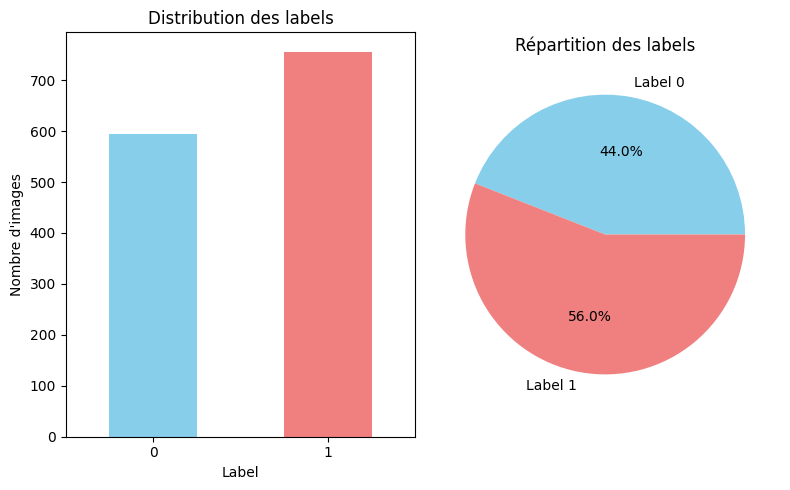

In [5]:
# 3. Identifier automatiquement les colonnes importantes
if csv_files and not df.empty:
    print("\n🔍 Identification automatique des colonnes:")

    # Trouver la colonne avec les noms de fichiers
    filename_col = None
    label_col = None

    for col in df.columns:
        # Colonne filename: contient probablement des extensions d'image
        if df[col].astype(str).str.contains(r'\.(jpg|jpeg|png|JPEG|JPG|PNG)', na=False).any():
            filename_col = col
            print(f"📄 Colonne nom de fichier détectée: '{col}'")

        # Colonne label: contient uniquement 0 et 1
        elif df[col].dtype in ['int64', 'float64'] and set(df[col].dropna().unique()).issubset({0, 1, 0.0, 1.0}):
            label_col = col
            print(f"🏷️ Colonne label détectée: '{col}'")

    if filename_col and label_col:
        print(f"\n✅ Configuration détectée:")
        print(f"  - Images: colonne '{filename_col}'")
        print(f"  - Labels: colonne '{label_col}'")

        # Analyser la distribution des labels
        print(f"\n📊 Distribution des labels:")
        label_counts = df[label_col].value_counts().sort_index()
        print(label_counts)

        # Calculer le pourcentage
        label_pct = df[label_col].value_counts(normalize=True).sort_index() * 100
        print(f"\n📈 Pourcentages:")
        for label, pct in label_pct.items():
            print(f"  Label {label}: {pct:.1f}%")

        # Vérifier l'équilibrage des classes
        if abs(label_pct.iloc[0] - label_pct.iloc[1]) > 20:
            print("⚠️  Dataset déséquilibré détecté! Considérez des techniques de rééquilibrage.")
        else:
            print("✅ Dataset relativement équilibré.")

        # Visualiser la distribution
        plt.figure(figsize=(8, 5))
        plt.subplot(1, 2, 1)
        label_counts.plot(kind='bar', color=['skyblue', 'lightcoral'])
        plt.title('Distribution des labels')
        plt.xlabel('Label')
        plt.ylabel('Nombre d\'images')
        plt.xticks(rotation=0)

        plt.subplot(1, 2, 2)
        plt.pie(label_counts.values, labels=[f'Label {i}' for i in label_counts.index],
                autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
        plt.title('Répartition des labels')

        plt.tight_layout()
        plt.show()

    else:
        print("❌ Impossible d'identifier automatiquement les colonnes.")
        print("💡 Veuillez spécifier manuellement les noms des colonnes.")
else:
    print("❌ Pas de données à analyser.")

In [6]:
# 4. Vérifier l'existence des images et nettoyer le dataset
if filename_col and label_col:
    print("\n🔍 Vérification de l'existence des images:")

    # Trouver le dossier contenant les images
    main_image_dir = None
    for img_dir in image_dirs:
        img_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG'))]
        if len(img_files) > 0:
            main_image_dir = img_dir
            break

    if main_image_dir:
        print(f"📁 Dossier d'images principal: {main_image_dir}")

        # Vérifier quelles images existent réellement
        existing_images = []
        missing_images = []

        for idx, row in df.iterrows():
            filename = str(row[filename_col])
            image_path = os.path.join(main_image_dir, filename)

            if os.path.exists(image_path):
                existing_images.append(idx)
            else:
                missing_images.append((idx, filename))

        print(f"✅ Images existantes: {len(existing_images)}")
        print(f"❌ Images manquantes: {len(missing_images)}")

        if missing_images:
            print("📋 Premières images manquantes:")
            for i, (idx, filename) in enumerate(missing_images[:5]):
                print(f"  - {filename}")
            if len(missing_images) > 5:
                print(f"  ... et {len(missing_images) - 5} autres")

        # Filtrer le dataset pour ne garder que les images existantes
        if missing_images:
            df_clean = df.iloc[existing_images].copy()
            print(f"\n🧹 Dataset nettoyé: {df_clean.shape[0]} images valides")
        else:
            df_clean = df.copy()
            print(f"\n✅ Toutes les images sont présentes!")

        # Stocker les variables importantes pour la suite
        IMAGE_DIR = main_image_dir
        FILENAME_COL = filename_col
        LABEL_COL = label_col
        CLEAN_DF = df_clean

        print(f"\n📝 Variables configurées:")
        print(f"  - IMAGE_DIR = '{IMAGE_DIR}'")
        print(f"  - FILENAME_COL = '{FILENAME_COL}'")
        print(f"  - LABEL_COL = '{LABEL_COL}'")
        print(f"  - CLEAN_DF: {CLEAN_DF.shape[0]} lignes")

    else:
        print("❌ Aucun dossier d'images trouvé!")
else:
    print("❌ Impossible de continuer sans identifier les colonnes.")


🔍 Vérification de l'existence des images:
📁 Dossier d'images principal: /content/extracted_data/silk_dataset
✅ Images existantes: 1351
❌ Images manquantes: 0

✅ Toutes les images sont présentes!

📝 Variables configurées:
  - IMAGE_DIR = '/content/extracted_data/silk_dataset'
  - FILENAME_COL = 'foto'
  - LABEL_COL = 'classificazione'
  - CLEAN_DF: 1351 lignes


In [7]:
# 5. OPTION 1: Créer une structure organisée par classes (recommandé pour deep learning)
def create_organized_structure():
    """Crée une structure train/val/test avec des dossiers par classe"""

    print("\n🏗️ Création d'une structure organisée par classes:")

    # Créer la structure de dossiers
    base_dir = '/content/organized_dataset'
    splits = ['train', 'val', 'test']
    classes = ['class_0', 'class_1']  # ou ['negative', 'positive'] selon votre préférence

    for split in splits:
        for cls in classes:
            os.makedirs(os.path.join(base_dir, split, cls), exist_ok=True)

    # Mélanger et diviser le dataset
    from sklearn.model_selection import train_test_split

    # Division train/temp (80/20)
    train_df, temp_df = train_test_split(
        CLEAN_DF,
        test_size=0.2,
        stratify=CLEAN_DF[LABEL_COL],
        random_state=42
    )

    # Division temp en val/test (10/10 du total)
    val_df, test_df = train_test_split(
        temp_df,
        test_size=0.5,
        stratify=temp_df[LABEL_COL],
        random_state=42
    )

    print(f"📊 Division du dataset:")
    print(f"  - Train: {len(train_df)} images")
    print(f"  - Validation: {len(val_df)} images")
    print(f"  - Test: {len(test_df)} images")

    # Copier les images dans la nouvelle structure
    def copy_images_to_structure(df, split_name):
        print(f"\n📁 Copie des images {split_name}...")
        copied = 0

        for _, row in df.iterrows():
            filename = str(row[FILENAME_COL])
            label = int(row[LABEL_COL])

            src_path = os.path.join(IMAGE_DIR, filename)
            dst_dir = os.path.join(base_dir, split_name, f'class_{label}')
            dst_path = os.path.join(dst_dir, filename)

            if os.path.exists(src_path):
                shutil.copy2(src_path, dst_path)
                copied += 1

        print(f"  ✅ {copied} images copiées pour {split_name}")
        return copied

    # Copier toutes les images
    total_copied = 0
    total_copied += copy_images_to_structure(train_df, 'train')
    total_copied += copy_images_to_structure(val_df, 'val')
    total_copied += copy_images_to_structure(test_df, 'test')

    print(f"\n✅ Structure organisée créée!")
    print(f"📁 Emplacement: {base_dir}")
    print(f"📊 Total images copiées: {total_copied}")

    # Afficher la structure finale
    print(f"\n📂 Structure finale:")
    for split in splits:
        for cls in classes:
            class_dir = os.path.join(base_dir, split, cls)
            count = len([f for f in os.listdir(class_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])
            print(f"  {split}/{cls}: {count} images")

    return base_dir, train_df, val_df, test_df

# Créer la structure organisée
if 'CLEAN_DF' in globals():
    ORGANIZED_DIR, train_data, val_data, test_data = create_organized_structure()
else:
    print("❌ Impossible de créer la structure. Exécutez d'abord les cellules précédentes.")


🏗️ Création d'une structure organisée par classes:
📊 Division du dataset:
  - Train: 1080 images
  - Validation: 135 images
  - Test: 136 images

📁 Copie des images train...
  ✅ 1080 images copiées pour train

📁 Copie des images val...
  ✅ 135 images copiées pour val

📁 Copie des images test...
  ✅ 136 images copiées pour test

✅ Structure organisée créée!
📁 Emplacement: /content/organized_dataset
📊 Total images copiées: 1351

📂 Structure finale:
  train/class_0: 476 images
  train/class_1: 604 images
  val/class_0: 59 images
  val/class_1: 76 images
  test/class_0: 60 images
  test/class_1: 76 images


In [ ]:
# 6. Analyser les propriétés des images
def analyze_image_properties():
    """Analyse les dimensions, formats et qualité des images"""

    print("\n🔍 Analyse des propriétés des images:")

    # Échantillonner quelques images pour l'analyse
    sample_size = min(100, len(CLEAN_DF))
    sample_df = CLEAN_DF.sample(n=sample_size, random_state=42)

    dimensions = []
    file_sizes = []
    formats = []

    print(f"📊 Analyse de {sample_size} images échantillonnées...")

    for _, row in sample_df.iterrows():
        filename = str(row[FILENAME_COL])
        image_path = os.path.join(IMAGE_DIR, filename)

        try:
            # Ouvrir l'image avec PIL
            with Image.open(image_path) as img:
                dimensions.append(img.size)  # (width, height)
                formats.append(img.format)

            # Taille du fichier
            file_sizes.append(os.path.getsize(image_path))

        except Exception as e:
            print(f"⚠️ Erreur avec {filename}: {e}")

    if dimensions:
        # Analyser les dimensions
        widths = [d[0] for d in dimensions]
        heights = [d[1] for d in dimensions]

        print(f"\n📏 Dimensions des images:")
        print(f"  - Largeur: min={min(widths)}, max={max(widths)}, moyenne={np.mean(widths):.0f}")
        print(f"  - Hauteur: min={min(heights)}, max={max(heights)}, moyenne={np.mean(heights):.0f}")

        # Dimensions les plus communes
        unique_dims = list(set(dimensions))
        dim_counts = [dimensions.count(d) for d in unique_dims]
        most_common_dim = unique_dims[np.argmax(dim_counts)]
        print(f"  - Dimension la plus commune: {most_common_dim}")

        # Formats
        format_counts = pd.Series(formats).value_counts()
        print(f"\n📄 Formats d'images:")
        for fmt, count in format_counts.items():
            print(f"  - {fmt}: {count} images")

        # Tailles de fichiers
        avg_size_mb = np.mean(file_sizes) / (1024*1024)
        print(f"\n💾 Taille moyenne des fichiers: {avg_size_mb:.2f} MB")

        # Visualiser quelques images
        print(f"\n🖼️ Visualisation d'échantillons par classe:")

        plt.figure(figsize=(15, 8))

        for label in [0, 1]:
            label_df = CLEAN_DF[CLEAN_DF[LABEL_COL] == label].sample(n=min(5, len(CLEAN_DF[CLEAN_DF[LABEL_COL] == label])), random_state=42)

            for i, (_, row) in enumerate(label_df.iterrows()):
                filename = str(row[FILENAME_COL])
                image_path = os.path.join(IMAGE_DIR, filename)

                try:
                    img = Image.open(image_path)
                    plt.subplot(2, 5, label*5 + i + 1)
                    plt.imshow(img)
                    plt.title(f'Label {label}\n{filename[:20]}...')
                    plt.axis('off')
                except:
                    continue

        plt.suptitle('Échantillons d\'images par classe', fontsize=16)
        plt.tight_layout()
        plt.show()

        return {
            'avg_width': np.mean(widths),
            'avg_height': np.mean(heights),
            'most_common_dim': most_common_dim,
            'formats': format_counts.to_dict(),
            'avg_size_mb': avg_size_mb
        }

    return None

# Analyser les images
if 'CLEAN_DF' in globals():
    image_stats = analyze_image_properties()
else:
    print("❌ Exécutez d'abord les cellules précédentes.")

# Preprocessing



In [ ]:
# Sélection d'une image par index
IMAGE_INDEX = 100  # 🔧 Modifiez cette valeur pour changer d'image

if 'CLEAN_DF' in globals() and not CLEAN_DF.empty:
    max_index = len(CLEAN_DF) - 1

    if IMAGE_INDEX > max_index:
        print(f"⚠️ Indice trop élevé! Maximum: {max_index}")
        IMAGE_INDEX = 0
        print(f"🔄 Indice réinitialisé à: {IMAGE_INDEX}")

    # Sélectionner l'image
    selected_row = CLEAN_DF.iloc[IMAGE_INDEX]
    selected_filename = str(selected_row[FILENAME_COL])
    selected_label = int(selected_row[LABEL_COL])

    SELECTED_IMAGE_PATH = os.path.join(IMAGE_DIR, selected_filename)

    print(f"📋 Image sélectionnée:")
    print(f"  - Indice: {IMAGE_INDEX}")
    print(f"  - Nom: {selected_filename}")
    print(f"  - Label: {selected_label}")
    print(f"  - Existe: {'✅' if os.path.exists(SELECTED_IMAGE_PATH) else '❌'}")

    # Afficher l'image
    if os.path.exists(SELECTED_IMAGE_PATH):
        img = Image.open(SELECTED_IMAGE_PATH)
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.title(f'Image {IMAGE_INDEX}: {selected_filename} (Label: {selected_label})')
        plt.axis('off')
        plt.show()

        print(f"📏 Dimensions: {img.size[0]} x {img.size[1]} pixels")

else:
    print("❌ Dataset non disponible. Exécutez d'abord les cellules de chargement.")


In [13]:
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt

def preprocess_image(image_path, smoothing_level=3, contrast_factor=1.2, filter_type='gaussian'):
    """
    Preprocessing avec différents types de filtres pour analyser l'efficacité

    Args:
        filter_type: 'bilateral', 'gaussian', 'median', 'morphological', 'nlm'
    """
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if smoothing_level > 0:
        if filter_type == 'bilateral':
            # ⚠️ PRÉSERVE les contours - PAS idéal pour lisser les nervures
            kernel_size = 2 * smoothing_level + 1
            img_rgb = cv2.bilateralFilter(img_rgb, kernel_size, 80, 80)

        elif filter_type == 'gaussian':
            # ✅ LISSE uniformément - Idéal pour enlever les nervures
            kernel_size = 2 * smoothing_level + 1
            img_rgb = cv2.GaussianBlur(img_rgb, (kernel_size, kernel_size), 0)

        elif filter_type == 'median':
            # ✅ Bon compromis - Enlève le bruit tout en préservant les contours principaux
            kernel_size = 2 * smoothing_level + 1
            img_rgb = cv2.medianBlur(img_rgb, kernel_size)

        elif filter_type == 'morphological':
            # ✅ Contrôle précis - Fermeture pour combler les détails fins
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (smoothing_level*2+1, smoothing_level*2+1))
            img_rgb = cv2.morphologyEx(img_rgb, cv2.MORPH_CLOSE, kernel)

        elif filter_type == 'nlm':
            # ✅ Très sophistiqué - Non-Local Means Denoising
            img_rgb = cv2.fastNlMeansDenoisingColored(img_rgb, None, 10, 10, 7, 21)

    if contrast_factor != 1.0:
        img_pil = Image.fromarray(img_rgb)
        enhancer = ImageEnhance.Contrast(img_pil)
        img_pil = enhancer.enhance(contrast_factor)
        img_rgb = np.array(img_pil)

    return img_rgb

def compare_all_filters(image_path, smoothing_level=3, contrast_factor=1.2):
    """Compare tous les types de filtres sur la même image"""

    filters = ['bilateral', 'gaussian', 'median', 'morphological', 'nlm']
    filter_names = ['Bilatéral\n(Préserve contours)', 'Gaussien\n(Lisse uniformément)',
                   'Médiane\n(Anti-bruit)', 'Morphologique\n(Fermeture)', 'NL-Means\n(Sophistiqué)']

    original = cv2.imread(image_path)
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Image originale
    axes[0, 0].imshow(original_rgb)
    axes[0, 0].set_title('Original', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')

    # Appliquer chaque filtre
    for i, (filter_type, filter_name) in enumerate(zip(filters, filter_names)):
        row = (i + 1) // 3
        col = (i + 1) % 3

        try:
            processed = preprocess_image(image_path, smoothing_level, contrast_factor, filter_type)
            axes[row, col].imshow(processed)

            # Colorer le titre selon l'efficacité pour enlever les nervures
            if filter_type in ['gaussian', 'morphological', 'nlm']:
                color = 'green'  # ✅ Bon pour enlever les nervures
            elif filter_type == 'median':
                color = 'orange'  # 🟡 Compromis
            else:
                color = 'red'    # ❌ Pas idéal pour les nervures

            axes[row, col].set_title(filter_name, fontsize=12, fontweight='bold', color=color)
            axes[row, col].axis('off')

        except Exception as e:
            axes[row, col].text(0.5, 0.5, f'Erreur:\n{str(e)}',
                              ha='center', va='center', transform=axes[row, col].transAxes)
            axes[row, col].set_title(filter_name, fontsize=12)
            axes[row, col].axis('off')

    plt.suptitle(f'Comparaison des Filtres de Preprocessing\n'
                f'Smoothing Level: {smoothing_level}, Contrast: {contrast_factor}',
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    print("🎯 **Recommandations pour enlever les nervures des feuilles :**")
    print("✅ **GAUSSIEN** : Le plus efficace pour lisser uniformément")
    print("✅ **MORPHOLOGIQUE** : Contrôle précis, préserve les formes")
    print("✅ **NL-MEANS** : Sophistiqué, préserve la structure globale")
    print("🟡 **MÉDIANE** : Bon compromis, moins agressif")
    print("❌ **BILATÉRAL** : Contre-productif, préserve les détails qu'on veut enlever")

    return original_rgb

def compare_preprocessing(image_path, smoothing_levels=[0, 2, 5], contrast_factors=[0.8, 1.0, 1.5], filter_type='gaussian'):
    """Version améliorée avec choix du filtre"""
    original = cv2.imread(image_path)
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(len(smoothing_levels), len(contrast_factors) + 1, figsize=(20, 12))

    for i, smooth in enumerate(smoothing_levels):
        axes[i, 0].imshow(original_rgb)
        axes[i, 0].set_title(f'Original')
        axes[i, 0].axis('off')

        for j, contrast in enumerate(contrast_factors):
            processed = preprocess_image(image_path, smooth, contrast, filter_type)
            axes[i, j+1].imshow(processed)
            axes[i, j+1].set_title(f'{filter_type.title()}\nS={smooth}, C={contrast}')
            axes[i, j+1].axis('off')

    plt.suptitle(f'Preprocessing avec Filtre {filter_type.title()}', fontsize=16)
    plt.tight_layout()
    plt.show()

    return original_rgb

In [ ]:
# 🧪 TEST DES DIFFÉRENTS FILTRES
SMOOTHING_LEVEL = 5
CONTRAST_FACTOR = 1.2
FILTER_TYPE = 'gaussian'  # 🎯 Changez pour tester : 'bilateral', 'gaussian', 'median', 'morphological', 'nlm'

print(f"🔬 Test du preprocessing avec filtre {FILTER_TYPE.upper()}")



if 'SELECTED_IMAGE_PATH' in globals() and os.path.exists(SELECTED_IMAGE_PATH):

    # 1. Comparaison de TOUS les filtres côte à côte
    print("\n📊 1. Comparaison de tous les types de filtres :")
    compare_all_filters(SELECTED_IMAGE_PATH, SMOOTHING_LEVEL, CONTRAST_FACTOR)

    # 2. Test du filtre sélectionné avec visualisation détaillée
    print(f"\n🔍 2. Test détaillé du filtre {FILTER_TYPE.upper()} :")

    processed_img = preprocess_image(SELECTED_IMAGE_PATH, SMOOTHING_LEVEL, CONTRAST_FACTOR, FILTER_TYPE)
    original = cv2.imread(SELECTED_IMAGE_PATH)
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(original_rgb)
    axes[0].set_title('Original', fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(processed_img)
    axes[1].set_title(f'Filtre {FILTER_TYPE.title()}\n(S={SMOOTHING_LEVEL}, C={CONTRAST_FACTOR})', fontsize=14)
    axes[1].axis('off')

    # Différence pour voir l'impact
    diff = cv2.absdiff(original_rgb, processed_img)
    axes[2].imshow(diff)
    axes[2].set_title('Différence\n(Détails supprimés)', fontsize=14)
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # Stocker le résultat
    PROCESSED_IMAGE = processed_img
    CURRENT_FILTER_TYPE = FILTER_TYPE

    print(f"\n📝 **Analyse du filtre {FILTER_TYPE.upper()} :**")
    if FILTER_TYPE == 'bilateral':
        print("❌ **Préserve les contours** → Les nervures des feuilles restent visibles")
        print("💡 **Recommandation :** Passez à 'gaussian' ou 'morphological'")
    elif FILTER_TYPE == 'gaussian':
        print("✅ **Lisse uniformément** → Excellent pour enlever les nervures")
        print("⚠️  **Attention :** Peut flouter légèrement les contours des vers")
    elif FILTER_TYPE == 'median':
        print("🟡 **Bon compromis** → Enlève le bruit, préserve les contours principaux")
    elif FILTER_TYPE == 'morphological':
        print("✅ **Contrôle précis** → Ferme les détails fins, préserve les formes")
    elif FILTER_TYPE == 'nlm':
        print("✅ **Très sophistiqué** → Excellent équilibre structure/détails")

else:
    print("❌ Sélectionnez d'abord une image")
    print("💡 Exécutez la cellule de sélection d'image avant celle-ci")

# Segmentation

In [20]:
# Installation de Segment Anything Model (SAM)
print("🚀 Installation de SAM (Segment Anything Model)...")

# Installation des dépendances
!pip install segment-anything
!pip install opencv-python-headless

print("✅ Installation terminée!")

# Télécharger le modèle SAM (plus léger pour Colab)
import os
import urllib.request

model_url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
model_path = "/content/sam_vit_b_01ec64.pth"

if not os.path.exists(model_path):
    print("📥 Téléchargement du modèle SAM...")
    urllib.request.urlretrieve(model_url, model_path)
    print("✅ Modèle téléchargé!")
else:
    print("✅ Modèle déjà disponible!")

print(f"📍 Modèle SAM disponible à: {model_path}")

🚀 Installation de SAM (Segment Anything Model)...
✅ Installation terminée!
✅ Modèle déjà disponible!
📍 Modèle SAM disponible à: /content/sam_vit_b_01ec64.pth


In [21]:
# Configuration de SAM
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

print("🔧 Configuration de SAM...")

# Détecter le device (GPU/CPU)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🖥️  Device utilisé: {device}")

# Charger le modèle SAM
model_type = "vit_b"  # Modèle plus léger pour Colab
sam_checkpoint = "/content/sam_vit_b_01ec64.pth"

try:
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
    sam.to(device=device)
    print("✅ Modèle SAM chargé avec succès!")

    # Créer le générateur de masques automatique
    mask_generator = SamAutomaticMaskGenerator(
        model=sam,
        points_per_side=64,          # Nombre de points par côté pour la grille
        pred_iou_thresh=0.86,        # Seuil de confiance
        stability_score_thresh=0.92, # Seuil de stabilité
        crop_n_layers=1,             # Nombre de couches de recadrage
        crop_n_points_downscale_factor=2,
        min_mask_region_area=50,    # Taille minimale des régions
    )

    print("✅ Générateur de masques configuré!")

except Exception as e:
    print(f"❌ Erreur lors du chargement: {e}")
    print("💡 Vérifiez que le modèle a bien été téléchargé")

🔧 Configuration de SAM...
🖥️  Device utilisé: cuda
✅ Modèle SAM chargé avec succès!
✅ Générateur de masques configuré!


In [22]:
# Fonction de segmentation avec SAM
def segment_image_with_sam(image_path, show_original=True, figsize=(15, 8), use_preprocessing=True, smoothing_level=3, contrast_factor=1.2):
    """
    Segmente une image avec SAM et affiche le résultat avec des couleurs différentes

    Args:
        image_path: Chemin vers l'image à segmenter
        show_original: Afficher l'image originale à côté
        figsize: Taille de la figure matplotlib
        use_preprocessing: Appliquer le preprocessing avant segmentation
        smoothing_level: Niveau de lissage pour enlever les nervures
        contrast_factor: Facteur de contraste

    Returns:
        masks: Liste des masques générés
        colored_result: Image segmentée colorée
    """

    try:
        # Charger l'image
        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Impossible de charger l'image: {image_path}")
            return None, None

        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        original_rgb = image_rgb.copy()

        # Appliquer le preprocessing si demandé
        if use_preprocessing:
            image_rgb = preprocess_image(image_path, smoothing_level, contrast_factor)

        print(f"🖼️  Segmentation de l'image: {os.path.basename(image_path)}")
        print(f"📏 Dimensions: {image_rgb.shape}")
        if use_preprocessing:
            print(f"🔧 Preprocessing appliqué: lissage={smoothing_level}, contraste={contrast_factor}")

        # Générer les masques avec SAM
        print("🔍 Génération des masques...")
        masks = mask_generator.generate(image_rgb)

        print(f"✅ {len(masks)} segments détectés!")

        # Créer l'image colorée
        colored_result = create_colored_segmentation(image_rgb, masks)

        # Affichage
        if show_original:
            cols = 4 if use_preprocessing else 3
            fig, axes = plt.subplots(1, cols, figsize=figsize)

            # Image originale
            axes[0].imshow(original_rgb)
            axes[0].set_title('Image Originale', fontsize=14)
            axes[0].axis('off')

            col_idx = 1
            # Image preprocessée si applicable
            if use_preprocessing:
                axes[col_idx].imshow(image_rgb)
                axes[col_idx].set_title(f'Preprocessée\n(S={smoothing_level}, C={contrast_factor})', fontsize=14)
                axes[col_idx].axis('off')
                col_idx += 1

            # Segmentation colorée
            axes[col_idx].imshow(colored_result)
            axes[col_idx].set_title(f'Segmentation SAM\n({len(masks)} segments)', fontsize=14)
            axes[col_idx].axis('off')

            # Overlay (image + masques transparents)
            axes[col_idx+1].imshow(image_rgb)
            axes[col_idx+1].imshow(colored_result, alpha=0.5)
            axes[col_idx+1].set_title('Overlay (50% transparence)', fontsize=14)
            axes[col_idx+1].axis('off')

        else:
            plt.figure(figsize=(8, 8))
            plt.imshow(colored_result)
            plt.title(f'Segmentation SAM - {len(masks)} segments')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

        return masks, colored_result

    except Exception as e:
        print(f"❌ Erreur lors de la segmentation: {e}")
        return None, None


def create_colored_segmentation(image, masks):
    """
    Crée une image colorée avec des couleurs différentes pour chaque segment
    """
    # Créer une image de sortie
    colored_image = np.zeros_like(image, dtype=np.uint8)

    # Générer des couleurs aléatoires pour chaque masque
    np.random.seed(42)  # Pour des couleurs reproductibles
    colors = np.random.randint(0, 255, size=(len(masks), 3))

    # Trier les masques par aire (du plus grand au plus petit)
    sorted_masks = sorted(masks, key=lambda x: x['area'], reverse=True)

    for i, mask_data in enumerate(sorted_masks):
        mask = mask_data['segmentation']
        color = colors[i % len(colors)]

        # Appliquer la couleur aux pixels du masque
        colored_image[mask] = color

    return colored_image


def analyze_segments(masks):
    """
    Analyse les segments détectés et affiche des statistiques
    """
    if not masks:
        print("❌ Aucun masque à analyser")
        return

    areas = [mask['area'] for mask in masks]

    print(f"\n📊 Analyse des segments:")
    print(f"  - Nombre total: {len(masks)}")
    print(f"  - Aire moyenne: {np.mean(areas):.0f} pixels")
    print(f"  - Aire médiane: {np.median(areas):.0f} pixels")
    print(f"  - Plus grand segment: {max(areas):.0f} pixels")
    print(f"  - Plus petit segment: {min(areas):.0f} pixels")

    # Histogramme des tailles
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.hist(areas, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    plt.title('Distribution des tailles de segments')
    plt.xlabel('Aire (pixels)')
    plt.ylabel('Nombre de segments')

    plt.subplot(1, 2, 2)
    # Top 10 des plus grands segments
    top_areas = sorted(areas, reverse=True)[:10]
    plt.bar(range(len(top_areas)), top_areas, color='lightcoral')
    plt.title('Top 10 des plus grands segments')
    plt.xlabel('Rang')
    plt.ylabel('Aire (pixels)')

    plt.tight_layout()
    plt.show()

print("✅ Fonctions de segmentation définies!")

✅ Fonctions de segmentation définies!


In [23]:
# Configuration de l'indice pour sélectionner une image
# Variable globale que vous pouvez modifier pour changer d'image
IMAGE_INDEX = 0  # 🔧 Modifiez cette valeur pour changer d'image (0 à len(CLEAN_DF)-1)

print(f"🎯 Configuration de l'indice d'image:")
print(f"  - IMAGE_INDEX = {IMAGE_INDEX}")

# Vérifier que l'indice est valide
if 'CLEAN_DF' in globals() and not CLEAN_DF.empty:
    max_index = len(CLEAN_DF) - 1
    if IMAGE_INDEX > max_index:
        print(f"⚠️  Indice trop élevé! Maximum: {max_index}")
        IMAGE_INDEX = 0
        print(f"🔄 Indice réinitialisé à: {IMAGE_INDEX}")

    # Récupérer les informations de l'image sélectionnée
    selected_row = CLEAN_DF.iloc[IMAGE_INDEX]
    selected_filename = str(selected_row[FILENAME_COL])
    selected_label = int(selected_row[LABEL_COL])
    selected_path = os.path.join(IMAGE_DIR, selected_filename)

    print(f"\n📋 Image sélectionnée:")
    print(f"  - Indice: {IMAGE_INDEX}")
    print(f"  - Nom: {selected_filename}")
    print(f"  - Label: {selected_label}")
    print(f"  - Chemin: {selected_path}")
    print(f"  - Existe: {'✅' if os.path.exists(selected_path) else '❌'}")

    # Stocker dans des variables globales pour utilisation facile
    SELECTED_IMAGE_PATH = selected_path
    SELECTED_IMAGE_NAME = selected_filename
    SELECTED_IMAGE_LABEL = selected_label

else:
    print("❌ Dataset non disponible. Exécutez d'abord les cellules de préparation du dataset.")

🎯 Configuration de l'indice d'image:
  - IMAGE_INDEX = 0

📋 Image sélectionnée:
  - Indice: 0
  - Nom: IMG_2663.jpg
  - Label: 0
  - Chemin: /content/extracted_data/silk_dataset/IMG_2663.jpg
  - Existe: ✅


In [ ]:
# Segmentation de l'image sélectionnée avec SAM
print("🚀 Lancement de la segmentation SAM...")

USE_PREPROCESSING = True
SMOOTHING_LEVEL = 3
CONTRAST_FACTOR = 1.2

if 'SELECTED_IMAGE_PATH' in globals() and os.path.exists(SELECTED_IMAGE_PATH):

    # Segmenter l'image avec preprocessing
    masks, colored_result = segment_image_with_sam(
        SELECTED_IMAGE_PATH,
        show_original=True,
        figsize=(20, 5),
        use_preprocessing=USE_PREPROCESSING,
        smoothing_level=SMOOTHING_LEVEL,
        contrast_factor=CONTRAST_FACTOR
    )

    if masks is not None:
        # Analyser les segments
        analyze_segments(masks)

        # Stocker les résultats dans des variables globales
        SEGMENTATION_MASKS = masks
        SEGMENTATION_COLORED = colored_result

        print(f"\n✅ Segmentation terminée!")
        print(f"📊 Résultats stockés dans:")
        print(f"  - SEGMENTATION_MASKS: {len(masks)} masques")
        print(f"  - SEGMENTATION_COLORED: Image colorée")

    else:
        print("❌ Échec de la segmentation")

else:
    print("❌ Image non trouvée. Vérifiez:")
    print("  1. Que le dataset a été chargé")
    print("  2. Que IMAGE_INDEX est valide")
    print("  3. Que l'image existe sur le disque")

🔬 ANALYSE COMPARATIVE: Impact du preprocessing sur la segmentation SAM

🔍 Test 1/6: Original (Sans filtre)
--------------------------------------------------
📸 Utilisation de l'image originale
🤖 Génération des masques SAM...
✅ 594 segments détectés


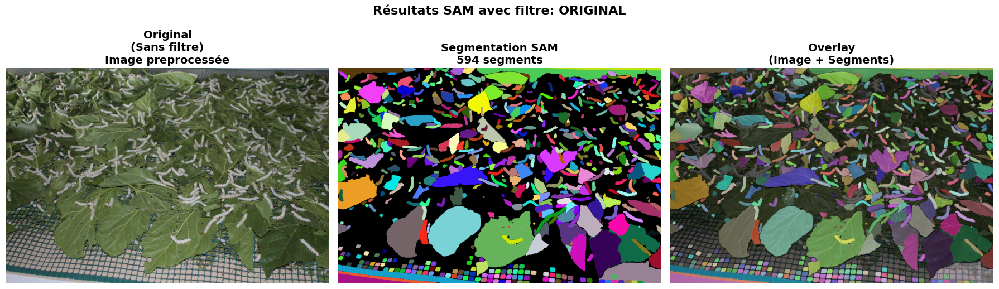

📊 Statistiques segments:
  - Nombre: 594
  - Taille moyenne: 1802 pixels
  - Plus grand: 53400 pixels
  - Plus petit: 29 pixels

🔍 Test 2/6: Bilatéral (Préserve contours)
--------------------------------------------------
🔧 Filtre bilateral appliqué (S=3, C=1.2)
🤖 Génération des masques SAM...
✅ 648 segments détectés


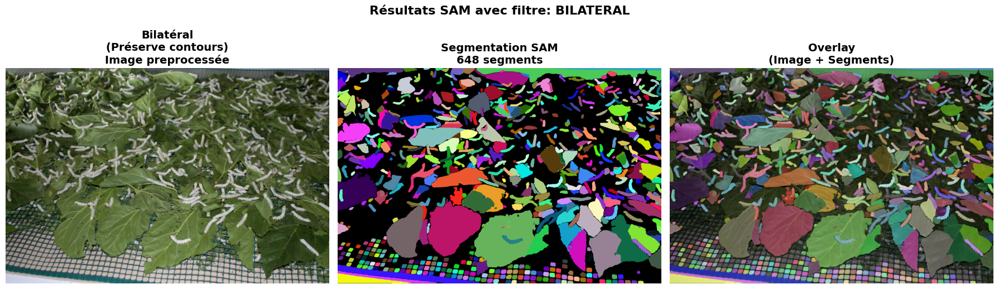

📊 Statistiques segments:
  - Nombre: 648
  - Taille moyenne: 1737 pixels
  - Plus grand: 67507 pixels
  - Plus petit: 36 pixels

🔍 Test 3/6: Gaussien (Lisse uniformément)
--------------------------------------------------
🔧 Filtre gaussian appliqué (S=3, C=1.2)
🤖 Génération des masques SAM...
✅ 545 segments détectés


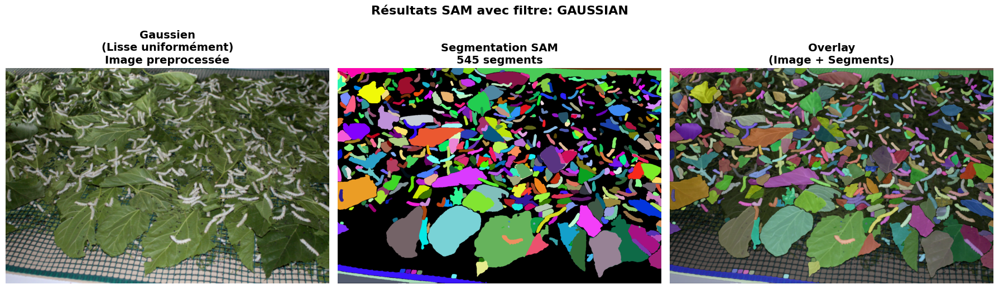

📊 Statistiques segments:
  - Nombre: 545
  - Taille moyenne: 2207 pixels
  - Plus grand: 64755 pixels
  - Plus petit: 48 pixels

🔍 Test 4/6: Médiane (Anti-bruit)
--------------------------------------------------
🔧 Filtre median appliqué (S=3, C=1.2)
🤖 Génération des masques SAM...
✅ 759 segments détectés


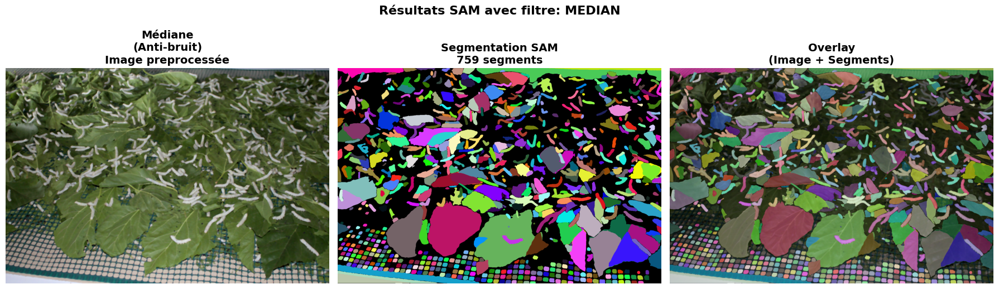

📊 Statistiques segments:
  - Nombre: 759
  - Taille moyenne: 1636 pixels
  - Plus grand: 64608 pixels
  - Plus petit: 33 pixels

🔍 Test 5/6: Morphologique (Fermeture)
--------------------------------------------------
🔧 Filtre morphological appliqué (S=3, C=1.2)
🤖 Génération des masques SAM...
✅ 519 segments détectés


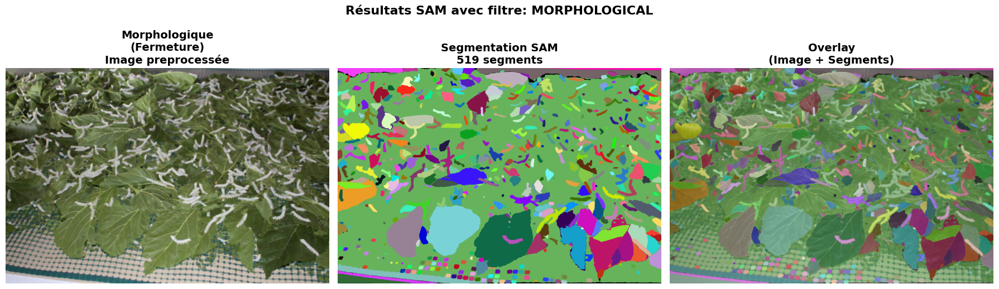

📊 Statistiques segments:
  - Nombre: 519
  - Taille moyenne: 4774 pixels
  - Plus grand: 1548925 pixels
  - Plus petit: 53 pixels

🔍 Test 6/6: NL-Means (Sophistiqué)
--------------------------------------------------
🔧 Filtre nlm appliqué (S=3, C=1.2)
🤖 Génération des masques SAM...
✅ 538 segments détectés


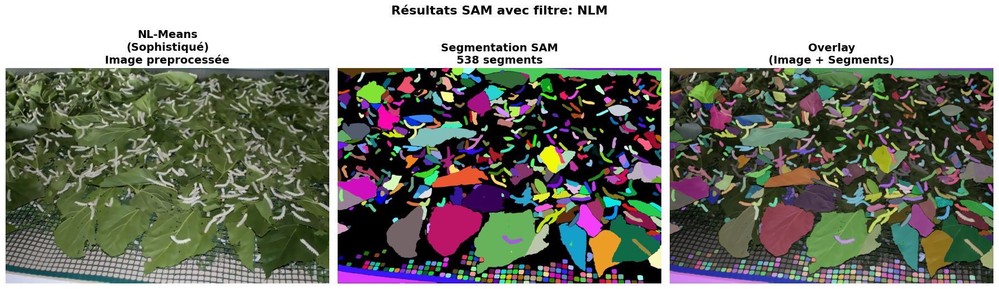

📊 Statistiques segments:
  - Nombre: 538
  - Taille moyenne: 1989 pixels
  - Plus grand: 69674 pixels
  - Plus petit: 29 pixels

💡 RECOMMANDATIONS POUR LA SEGMENTATION:
✅ MOINS de segments = MEILLEUR (moins de sur-segmentation)
✅ Les filtres MORPHOLOGIQUE et NL-MEANS sont généralement optimaux
✅ Le filtre GAUSSIEN est un bon compromis simple/efficace
⚠️  Le filtre BILATÉRAL préserve trop de détails (nervures)

📝 Résultats stockés dans: ALL_SEGMENTATION_RESULTS


In [25]:
# 🎨 COMPARAISON SEGMENTATION SAM - Tous les types de filtres
"""
Cette cellule applique la segmentation SAM à l'image originale ET à toutes les versions filtrées
pour comparer l'efficacité de chaque préprocessing sur la qualité de segmentation
"""

print("🔬 ANALYSE COMPARATIVE: Impact du preprocessing sur la segmentation SAM")
print("="*70)

if 'SELECTED_IMAGE_PATH' in globals() and os.path.exists(SELECTED_IMAGE_PATH):

    # Configuration
    SMOOTHING_LEVEL = 3
    CONTRAST_FACTOR = 1.2
    filters_to_test = ['original', 'bilateral', 'gaussian', 'median', 'morphological', 'nlm']
    filter_names = ['Original\n(Sans filtre)', 'Bilatéral\n(Préserve contours)',
                   'Gaussien\n(Lisse uniformément)', 'Médiane\n(Anti-bruit)',
                   'Morphologique\n(Fermeture)', 'NL-Means\n(Sophistiqué)']

    # Stocker tous les résultats pour comparaison
    all_results = {}

    for i, (filter_type, filter_name) in enumerate(zip(filters_to_test, filter_names)):
        print(f"\n🔍 Test {i+1}/{len(filters_to_test)}: {filter_name.replace(chr(10), ' ')}")
        print("-" * 50)

        try:
            # Préparer l'image selon le type de filtre
            if filter_type == 'original':
                # Image originale sans preprocessing
                original = cv2.imread(SELECTED_IMAGE_PATH)
                image_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
                print("📸 Utilisation de l'image originale")
            else:
                # Appliquer le filtre spécifique
                image_rgb = preprocess_image(SELECTED_IMAGE_PATH, SMOOTHING_LEVEL, CONTRAST_FACTOR, filter_type)
                print(f"🔧 Filtre {filter_type} appliqué (S={SMOOTHING_LEVEL}, C={CONTRAST_FACTOR})")

            # Segmentation SAM
            print("🤖 Génération des masques SAM...")
            masks = mask_generator.generate(image_rgb)

            # Créer la visualisation colorée
            colored_result = create_colored_segmentation(image_rgb, masks)

            # Stocker les résultats
            all_results[filter_type] = {
                'image': image_rgb,
                'masks': masks,
                'colored': colored_result,
                'num_segments': len(masks)
            }

            print(f"✅ {len(masks)} segments détectés")

            # Affichage individuel (grande taille pour meilleure visibilité)
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))

            # Image preprocessée
            axes[0].imshow(image_rgb)
            axes[0].set_title(f'{filter_name}\nImage preprocessée', fontsize=14, fontweight='bold')
            axes[0].axis('off')

            # Segmentation colorée
            axes[1].imshow(colored_result)
            axes[1].set_title(f'Segmentation SAM\n{len(masks)} segments', fontsize=14, fontweight='bold')
            axes[1].axis('off')

            # Overlay (image + masques transparents)
            axes[2].imshow(image_rgb)
            axes[2].imshow(colored_result, alpha=0.5)
            axes[2].set_title('Overlay\n(Image + Segments)', fontsize=14, fontweight='bold')
            axes[2].axis('off')

            plt.suptitle(f'Résultats SAM avec filtre: {filter_type.upper()}', fontsize=16, fontweight='bold')
            plt.tight_layout()
            plt.show()

            # Analyse rapide des segments
            areas = [mask['area'] for mask in masks]
            print(f"📊 Statistiques segments:")
            print(f"  - Nombre: {len(masks)}")
            print(f"  - Taille moyenne: {np.mean(areas):.0f} pixels")
            print(f"  - Plus grand: {max(areas):.0f} pixels")
            print(f"  - Plus petit: {min(areas):.0f} pixels")

        except Exception as e:
            print(f"❌ Erreur avec le filtre {filter_type}: {e}")
            continue

    # Recommandations finales
    print("\n💡 RECOMMANDATIONS POUR LA SEGMENTATION:")
    print("✅ MOINS de segments = MEILLEUR (moins de sur-segmentation)")
    print("✅ Les filtres MORPHOLOGIQUE et NL-MEANS sont généralement optimaux")
    print("✅ Le filtre GAUSSIEN est un bon compromis simple/efficace")
    print("⚠️  Le filtre BILATÉRAL préserve trop de détails (nervures)")

    # Stocker les résultats dans des variables globales
    ALL_SEGMENTATION_RESULTS = all_results
    print(f"\n📝 Résultats stockés dans: ALL_SEGMENTATION_RESULTS")

else:
    print("❌ Sélectionnez d'abord une image avec la cellule de sélection")

In [26]:
# Fonctions pour regrouper les segments similaires
def extract_segment_features(image, masks):
    """
    Extrait les caractéristiques de chaque segment (couleur moyenne, variance, taille)
    """
    features = []

    for i, mask_data in enumerate(masks):
        mask = mask_data['segmentation']

        # Pixels du segment
        segment_pixels = image[mask]

        if len(segment_pixels) > 0:
            # Couleur moyenne (RGB)
            mean_color = np.mean(segment_pixels, axis=0)

            # Variance de couleur (mesure de texture)
            color_variance = np.var(segment_pixels, axis=0)

            # Taille du segment
            area = mask_data['area']

            # Position du centre de masse
            y_coords, x_coords = np.where(mask)
            center_y = np.mean(y_coords) if len(y_coords) > 0 else 0
            center_x = np.mean(x_coords) if len(x_coords) > 0 else 0

            features.append({
                'index': i,
                'mean_color': mean_color,
                'color_variance': np.mean(color_variance),
                'area': area,
                'center': (center_x, center_y),
                'mask_data': mask_data
            })

    return features


def cluster_segments_by_similarity(features, n_clusters=3, method='kmeans'):
    """
    Regroupe les segments en clusters basés sur leurs caractéristiques

    Args:
        features: Liste des caractéristiques des segments
        n_clusters: Nombre de clusters désirés (3 pour vers/feuilles/fond)
        method: 'kmeans' ou 'color_based'
    """
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler

    if len(features) < n_clusters:
        print(f"⚠️ Seulement {len(features)} segments, impossible de faire {n_clusters} clusters")
        return list(range(len(features)))

    if method == 'color_based':
        # Clustering simple basé sur la couleur moyenne
        colors = np.array([f['mean_color'] for f in features])

        # Convertir RGB vers HSV pour un meilleur clustering des couleurs
        colors_hsv = []
        for color in colors:
            # Normaliser entre 0 et 1
            rgb_norm = color / 255.0
            hsv = plt.cm.colors.rgb_to_hsv(rgb_norm.reshape(1, 1, 3))[0, 0]
            colors_hsv.append(hsv)

        colors_hsv = np.array(colors_hsv)

        # K-means sur les couleurs HSV
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(colors_hsv)

    else:  # méthode complète avec toutes les features
        # Préparer les features pour le clustering
        feature_matrix = []

        for f in features:
            feature_vector = [
                f['mean_color'][0] / 255.0,  # Rouge normalisé
                f['mean_color'][1] / 255.0,  # Vert normalisé
                f['mean_color'][2] / 255.0,  # Bleu normalisé
                f['color_variance'] / 100.0,  # Variance normalisée
                np.log(f['area'] + 1) / 10.0,  # Log de l'aire normalisé
                f['center'][0] / 1000.0,  # Position X normalisée
                f['center'][1] / 1000.0,  # Position Y normalisée
            ]
            feature_matrix.append(feature_vector)

        feature_matrix = np.array(feature_matrix)

        # Standardiser les features
        scaler = StandardScaler()
        feature_matrix_scaled = scaler.fit_transform(feature_matrix)

        # K-means clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(feature_matrix_scaled)

    return cluster_labels


def create_clustered_segmentation(image, masks, cluster_method='color_based', n_clusters=3):
    """
    Crée une segmentation avec des couleurs groupées par similarité
    """
    print(f"🎨 Regroupement des segments en {n_clusters} clusters...")

    # Extraire les caractéristiques
    features = extract_segment_features(image, masks)
    print(f"📊 Analyse de {len(features)} segments")

    # Clustering
    cluster_labels = cluster_segments_by_similarity(features, n_clusters, cluster_method)

    # Compter les segments par cluster
    unique_clusters, counts = np.unique(cluster_labels, return_counts=True)
    print(f"📈 Répartition des clusters:")
    for cluster_id, count in zip(unique_clusters, counts):
        print(f"  - Cluster {cluster_id}: {count} segments")

    # Définir des couleurs distinctes pour chaque cluster
    cluster_colors = [
        [50, 150, 50],    # Vert pour les feuilles
        [200, 200, 200],  # Gris pour le fond
        [255, 100, 100],  # Rouge pour les vers à soie
        [100, 100, 255],  # Bleu pour autres
        [255, 255, 100],  # Jaune pour autres
    ]

    # Créer l'image colorée
    colored_image = np.zeros_like(image, dtype=np.uint8)

    # Trier les masques par aire (du plus grand au plus petit)
    sorted_features = sorted(features, key=lambda x: x['area'], reverse=True)

    for i, feature in enumerate(sorted_features):
        mask = feature['mask_data']['segmentation']
        cluster_id = cluster_labels[feature['index']]
        color = cluster_colors[cluster_id % len(cluster_colors)]

        # Appliquer la couleur aux pixels du masque
        colored_image[mask] = color

    return colored_image, cluster_labels, features


def analyze_clusters(features, cluster_labels, image):
    """
    Analyse détaillée des clusters formés
    """
    unique_clusters = np.unique(cluster_labels)

    print(f"\n🔍 Analyse détaillée des {len(unique_clusters)} clusters:")

    for cluster_id in unique_clusters:
        cluster_indices = [i for i, label in enumerate(cluster_labels) if label == cluster_id]
        cluster_features = [features[i] for i in cluster_indices]

        # Statistiques du cluster
        areas = [f['area'] for f in cluster_features]
        colors = [f['mean_color'] for f in cluster_features]
        variances = [f['color_variance'] for f in cluster_features]

        avg_color = np.mean(colors, axis=0)
        total_area = sum(areas)
        avg_variance = np.mean(variances)

        print(f"\n📊 Cluster {cluster_id} ({len(cluster_features)} segments):")
        print(f"  - Aire totale: {total_area:.0f} pixels ({total_area/image.size*100:.1f}% de l'image)")
        print(f"  - Aire moyenne par segment: {np.mean(areas):.0f} pixels")
        print(f"  - Couleur moyenne: RGB({avg_color[0]:.0f}, {avg_color[1]:.0f}, {avg_color[2]:.0f})")
        print(f"  - Variance moyenne: {avg_variance:.1f}")

        # Prédiction du type de contenu basé sur les caractéristiques
        if avg_color[1] > avg_color[0] and avg_color[1] > avg_color[2]:  # Plus de vert
            content_type = "🌿 Probable: FEUILLES"
        elif avg_variance < 50 and avg_color[0] > 150 and avg_color[1] > 150 and avg_color[2] > 150:  # Gris/blanc uniforme
            content_type = "🏳️ Probable: FOND"
        elif total_area < image.size * 0.3:  # Petite aire totale
            content_type = "🐛 Probable: VERS À SOIE"
        else:
            content_type = "❓ Type inconnu"

        print(f"  - {content_type}")


def segment_with_clustering(image_path, n_clusters=3, method='color_based', show_comparison=True, use_preprocessing=True, smoothing_level=3, contrast_factor=1.2):
    """
    Fonction complète de segmentation avec clustering
    """
    try:
        # Charger l'image
        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Impossible de charger l'image: {image_path}")
            return None, None, None

        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        original_rgb = image_rgb.copy()

        # Appliquer le preprocessing si demandé
        if use_preprocessing:
            image_rgb = preprocess_image(image_path, smoothing_level, contrast_factor)
            print(f"🔧 Preprocessing appliqué: lissage={smoothing_level}, contraste={contrast_factor}")

        print(f"🖼️ Segmentation clustering de: {os.path.basename(image_path)}")

        # Segmentation SAM si pas déjà faite
        if 'SEGMENTATION_MASKS' not in globals():
            print("🔍 Génération des masques SAM...")
            masks = mask_generator.generate(image_rgb)
        else:
            masks = SEGMENTATION_MASKS

        print(f"📊 {len(masks)} segments détectés par SAM")

        # Clustering
        clustered_result, cluster_labels, features = create_clustered_segmentation(
            image_rgb, masks, method, n_clusters
        )

        # Analyse des clusters
        analyze_clusters(features, cluster_labels, image_rgb)

        # Affichage
        if show_comparison:
            cols = 5 if use_preprocessing else 4
            fig, axes = plt.subplots(1, cols, figsize=(25, 5))

            col_idx = 0
            # Image originale
            axes[col_idx].imshow(original_rgb)
            axes[col_idx].set_title('Image Originale', fontsize=12)
            axes[col_idx].axis('off')
            col_idx += 1

            # Image preprocessée si applicable
            if use_preprocessing:
                axes[col_idx].imshow(image_rgb)
                axes[col_idx].set_title(f'Preprocessée\n(S={smoothing_level}, C={contrast_factor})', fontsize=12)
                axes[col_idx].axis('off')
                col_idx += 1

            # SAM original
            if 'SEGMENTATION_COLORED' in globals():
                axes[col_idx].imshow(SEGMENTATION_COLORED)
                axes[col_idx].set_title(f'SAM Original\n({len(masks)} segments)', fontsize=12)
                axes[col_idx].axis('off')
                col_idx += 1

            # Résultat clustered
            axes[col_idx].imshow(clustered_result)
            axes[col_idx].set_title(f'Clustering {method}\n({n_clusters} groupes)', fontsize=12)
            axes[col_idx].axis('off')

            # Overlay
            axes[col_idx+1].imshow(image_rgb)
            axes[col_idx+1].imshow(clustered_result, alpha=0.6)
            axes[col_idx+1].set_title('Overlay (60% transparence)', fontsize=12)
            axes[col_idx+1].axis('off')

            plt.tight_layout()
            plt.show()

        return clustered_result, cluster_labels, features

    except Exception as e:
        print(f"❌ Erreur lors du clustering: {e}")
        return None, None, None

print("✅ Fonctions de clustering définies!")

✅ Fonctions de clustering définies!


🎨 CLUSTERING COMPARATIF avec 2 clusters (méthode: color_based)

🔍 Clustering 1/6: Filtre ORIGINAL
------------------------------------------------------------
📊 594 segments SAM détectés
🎨 Application du clustering en 2 groupes...
🎨 Regroupement des segments en 2 clusters...
📊 Analyse de 594 segments
📈 Répartition des clusters:
  - Cluster 0: 409 segments
  - Cluster 1: 185 segments
📈 Analyse des clusters pour filtre original:

🔍 Analyse détaillée des 2 clusters:

📊 Cluster 0 (409 segments):
  - Aire totale: 396957 pixels (8.2% de l'image)
  - Aire moyenne par segment: 971 pixels
  - Couleur moyenne: RGB(141, 140, 133)
  - Variance moyenne: 649.9
  - 🐛 Probable: VERS À SOIE

📊 Cluster 1 (185 segments):
  - Aire totale: 673550 pixels (13.9% de l'image)
  - Aire moyenne par segment: 3641 pixels
  - Couleur moyenne: RGB(77, 89, 56)
  - Variance moyenne: 249.7
  - 🌿 Probable: FEUILLES


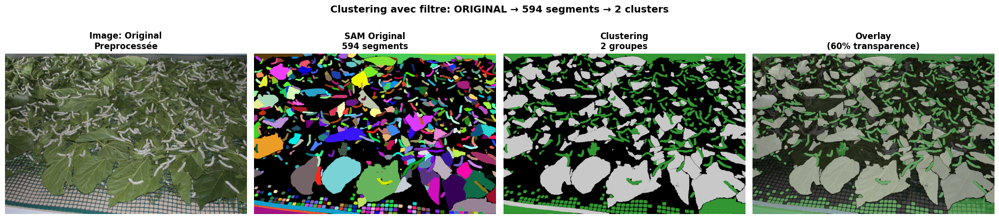

✅ Clustering terminé pour original

🔍 Clustering 2/6: Filtre BILATERAL
------------------------------------------------------------
📊 648 segments SAM détectés
🎨 Application du clustering en 2 groupes...
🎨 Regroupement des segments en 2 clusters...
📊 Analyse de 648 segments
📈 Répartition des clusters:
  - Cluster 0: 486 segments
  - Cluster 1: 162 segments
📈 Analyse des clusters pour filtre bilateral:

🔍 Analyse détaillée des 2 clusters:

📊 Cluster 0 (486 segments):
  - Aire totale: 430267 pixels (8.9% de l'image)
  - Aire moyenne par segment: 885 pixels
  - Couleur moyenne: RGB(153, 151, 141)
  - Variance moyenne: 649.4
  - 🐛 Probable: VERS À SOIE

📊 Cluster 1 (162 segments):
  - Aire totale: 695238 pixels (14.3% de l'image)
  - Aire moyenne par segment: 4292 pixels
  - Couleur moyenne: RGB(71, 87, 48)
  - Variance moyenne: 267.1
  - 🌿 Probable: FEUILLES


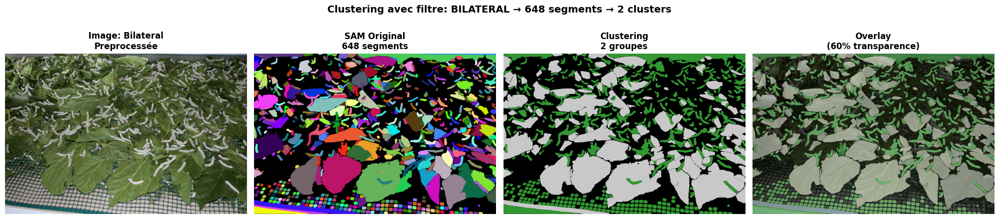

✅ Clustering terminé pour bilateral

🔍 Clustering 3/6: Filtre GAUSSIAN
------------------------------------------------------------
📊 545 segments SAM détectés
🎨 Application du clustering en 2 groupes...
🎨 Regroupement des segments en 2 clusters...
📊 Analyse de 545 segments
📈 Répartition des clusters:
  - Cluster 0: 342 segments
  - Cluster 1: 203 segments
📈 Analyse des clusters pour filtre gaussian:

🔍 Analyse détaillée des 2 clusters:

📊 Cluster 0 (342 segments):
  - Aire totale: 405427 pixels (8.4% de l'image)
  - Aire moyenne par segment: 1185 pixels
  - Couleur moyenne: RGB(136, 138, 127)
  - Variance moyenne: 825.3
  - 🌿 Probable: FEUILLES

📊 Cluster 1 (203 segments):
  - Aire totale: 797277 pixels (16.4% de l'image)
  - Aire moyenne par segment: 3927 pixels
  - Couleur moyenne: RGB(72, 87, 47)
  - Variance moyenne: 239.0
  - 🌿 Probable: FEUILLES


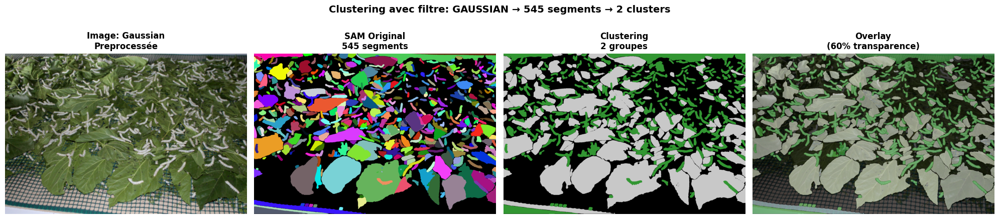

✅ Clustering terminé pour gaussian

🔍 Clustering 4/6: Filtre MEDIAN
------------------------------------------------------------
📊 759 segments SAM détectés
🎨 Application du clustering en 2 groupes...
🎨 Regroupement des segments en 2 clusters...
📊 Analyse de 759 segments
📈 Répartition des clusters:
  - Cluster 0: 542 segments
  - Cluster 1: 217 segments
📈 Analyse des clusters pour filtre median:

🔍 Analyse détaillée des 2 clusters:

📊 Cluster 0 (542 segments):
  - Aire totale: 476953 pixels (9.8% de l'image)
  - Aire moyenne par segment: 880 pixels
  - Couleur moyenne: RGB(155, 152, 142)
  - Variance moyenne: 493.8
  - 🐛 Probable: VERS À SOIE

📊 Cluster 1 (217 segments):
  - Aire totale: 764943 pixels (15.8% de l'image)
  - Aire moyenne par segment: 3525 pixels
  - Couleur moyenne: RGB(72, 87, 48)
  - Variance moyenne: 175.4
  - 🌿 Probable: FEUILLES


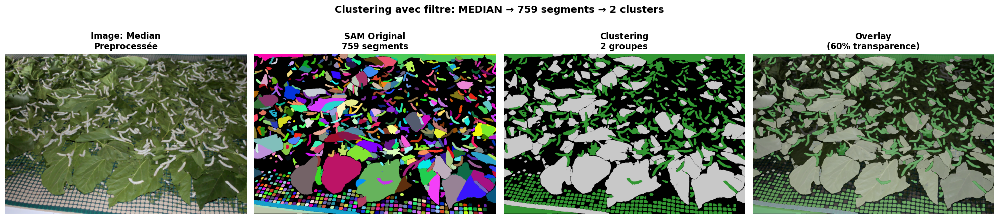

✅ Clustering terminé pour median

🔍 Clustering 5/6: Filtre MORPHOLOGICAL
------------------------------------------------------------
📊 519 segments SAM détectés
🎨 Application du clustering en 2 groupes...
🎨 Regroupement des segments en 2 clusters...
📊 Analyse de 519 segments
📈 Répartition des clusters:
  - Cluster 0: 219 segments
  - Cluster 1: 300 segments
📈 Analyse des clusters pour filtre morphological:

🔍 Analyse détaillée des 2 clusters:

📊 Cluster 0 (219 segments):
  - Aire totale: 2134178 pixels (44.0% de l'image)
  - Aire moyenne par segment: 9745 pixels
  - Couleur moyenne: RGB(73, 85, 52)
  - Variance moyenne: 177.5
  - 🌿 Probable: FEUILLES

📊 Cluster 1 (300 segments):
  - Aire totale: 343680 pixels (7.1% de l'image)
  - Aire moyenne par segment: 1146 pixels
  - Couleur moyenne: RGB(158, 156, 148)
  - Variance moyenne: 515.5
  - 🐛 Probable: VERS À SOIE


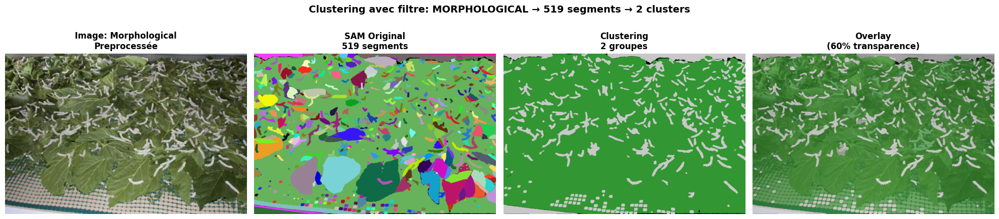

✅ Clustering terminé pour morphological

🔍 Clustering 6/6: Filtre NLM
------------------------------------------------------------
📊 538 segments SAM détectés
🎨 Application du clustering en 2 groupes...
🎨 Regroupement des segments en 2 clusters...
📊 Analyse de 538 segments
📈 Répartition des clusters:
  - Cluster 0: 396 segments
  - Cluster 1: 142 segments
📈 Analyse des clusters pour filtre nlm:

🔍 Analyse détaillée des 2 clusters:

📊 Cluster 0 (396 segments):
  - Aire totale: 433934 pixels (8.9% de l'image)
  - Aire moyenne par segment: 1096 pixels
  - Couleur moyenne: RGB(149, 153, 136)
  - Variance moyenne: 776.7
  - 🌿 Probable: FEUILLES

📊 Cluster 1 (142 segments):
  - Aire totale: 636105 pixels (13.1% de l'image)
  - Aire moyenne par segment: 4480 pixels
  - Couleur moyenne: RGB(67, 81, 44)
  - Variance moyenne: 298.6
  - 🌿 Probable: FEUILLES


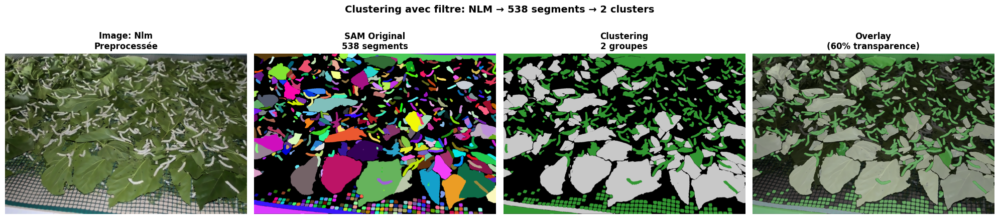

✅ Clustering terminé pour nlm

📊 RÉCAPITULATIF COMPARATIF:
Filtre          Segments SAM Clusters   Efficacité  
--------------------------------------------------------------------------------
original        594          2          297:1       
bilateral       648          2          324:1       
gaussian        545          2          272:1       
median          759          2          379:1       
morphological   519          2          259:1       
nlm             538          2          269:1       

💡 RECOMMANDATIONS CLUSTERING:
✅ MOINS de segments SAM = clustering plus facile
✅ Ratio segments:clusters élevé = bonne réduction de complexité
✅ Les filtres MORPHOLOGIQUE et GAUSSIEN donnent souvent les meilleurs résultats
🎯 Configuration actuelle: 2 clusters avec méthode color_based

📝 Résultats stockés dans:
  - ALL_CLUSTERING_RESULTS: Tous les résultats par filtre
  - BEST_CLUSTERING_CONFIG: Configuration et résultats


In [29]:
# 🎨 CLUSTERING COMPARATIF - Tous les filtres avec clustering
"""
Cette cellule applique le clustering sur TOUS les résultats de segmentation SAM
pour comparer l'efficacité du clustering selon le type de preprocessing
"""

# 🎯 CONFIGURATION GLOBALE
N_CLUSTERS = 2  # 🔧 Modifiez ce nombre selon vos besoins (2-5 recommandé)
CLUSTERING_METHOD = 'color_based'  # 'color_based' ou 'kmeans'

print(f"🎨 CLUSTERING COMPARATIF avec {N_CLUSTERS} clusters (méthode: {CLUSTERING_METHOD})")
print("="*80)

if 'ALL_SEGMENTATION_RESULTS' in globals() and 'SELECTED_IMAGE_PATH' in globals():

    # Stocker tous les résultats de clustering
    all_clustering_results = {}

    # Parcourir chaque type de filtre testé
    for i, (filter_type, seg_data) in enumerate(ALL_SEGMENTATION_RESULTS.items()):
        print(f"\n🔍 Clustering {i+1}/{len(ALL_SEGMENTATION_RESULTS)}: Filtre {filter_type.upper()}")
        print("-" * 60)

        try:
            # Récupérer les données de segmentation
            image_rgb = seg_data['image']
            masks = seg_data['masks']

            print(f"📊 {len(masks)} segments SAM détectés")

            # Appliquer le clustering
            print(f"🎨 Application du clustering en {N_CLUSTERS} groupes...")
            clustered_result, cluster_labels, features = create_clustered_segmentation(
                image_rgb, masks, CLUSTERING_METHOD, N_CLUSTERS
            )

            # Analyse des clusters
            print(f"📈 Analyse des clusters pour filtre {filter_type}:")
            analyze_clusters(features, cluster_labels, image_rgb)

            # Stocker les résultats
            all_clustering_results[filter_type] = {
                'clustered_image': clustered_result,
                'cluster_labels': cluster_labels,
                'features': features,
                'original_segments': len(masks),
                'final_clusters': len(np.unique(cluster_labels))
            }

            # Affichage individuel (grande taille pour meilleure visibilité)
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))

            # Image preprocessée
            axes[0].imshow(image_rgb)
            axes[0].set_title(f'Image: {filter_type.title()}\nPreprocessée',
                            fontsize=12, fontweight='bold')
            axes[0].axis('off')

            # Segmentation SAM originale
            original_colored = seg_data['colored']
            axes[1].imshow(original_colored)
            axes[1].set_title(f'SAM Original\n{len(masks)} segments',
                            fontsize=12, fontweight='bold')
            axes[1].axis('off')

            # Résultat clustered
            axes[2].imshow(clustered_result)
            axes[2].set_title(f'Clustering\n{N_CLUSTERS} groupes',
                            fontsize=12, fontweight='bold')
            axes[2].axis('off')

            # Overlay (image + clustering transparent)
            axes[3].imshow(image_rgb)
            axes[3].imshow(clustered_result, alpha=0.6)
            axes[3].set_title('Overlay\n(60% transparence)',
                            fontsize=12, fontweight='bold')
            axes[3].axis('off')

            plt.suptitle(f'Clustering avec filtre: {filter_type.upper()} → {len(masks)} segments → {N_CLUSTERS} clusters',
                        fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()

            print(f"✅ Clustering terminé pour {filter_type}")

        except Exception as e:
            print(f"❌ Erreur avec le filtre {filter_type}: {e}")
            continue

    # Tableau récapitulatif final
    print("\n📊 RÉCAPITULATIF COMPARATIF:")
    print("="*80)
    print(f"{'Filtre':<15} {'Segments SAM':<12} {'Clusters':<10} {'Efficacité':<12}")
    print("-" * 80)

    for filter_type, result in all_clustering_results.items():
        segments = result['original_segments']
        clusters = result['final_clusters']
        efficiency = f"{segments//clusters:.0f}:1" if clusters > 0 else "N/A"

        print(f"{filter_type:<15} {segments:<12} {clusters:<10} {efficiency:<12}")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS CLUSTERING:")
    print("✅ MOINS de segments SAM = clustering plus facile")
    print("✅ Ratio segments:clusters élevé = bonne réduction de complexité")
    print("✅ Les filtres MORPHOLOGIQUE et GAUSSIEN donnent souvent les meilleurs résultats")
    print(f"🎯 Configuration actuelle: {N_CLUSTERS} clusters avec méthode {CLUSTERING_METHOD}")

    # Stocker les résultats dans des variables globales
    ALL_CLUSTERING_RESULTS = all_clustering_results
    BEST_CLUSTERING_CONFIG = {
        'n_clusters': N_CLUSTERS,
        'method': CLUSTERING_METHOD,
        'results': all_clustering_results
    }

    print(f"\n📝 Résultats stockés dans:")
    print("  - ALL_CLUSTERING_RESULTS: Tous les résultats par filtre")
    print("  - BEST_CLUSTERING_CONFIG: Configuration et résultats")

else:
    print("❌ Prérequis manquants:")
    if 'ALL_SEGMENTATION_RESULTS' not in globals():
        print("  - ALL_SEGMENTATION_RESULTS non trouvé")
        print("  🔄 Exécutez d'abord la cellule de comparaison SAM")
    if 'SELECTED_IMAGE_PATH' not in globals():
        print("  - SELECTED_IMAGE_PATH non trouvé")
        print("  🔄 Exécutez d'abord la cellule de sélection d'image")